In [1]:
import scanpy as sc

In [2]:
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.image as mpimg
import pandas as pd
import numpy as np
from paste2 import PASTE2, projection, model_selection

In [ ]:
import squidpy as sq

In [4]:
def plot_slices_overlap(slices):
    plt.figure(figsize=(7,7))

    all_values = np.concatenate([adata.obs['percent.butterfly'].values for adata in slices])
    vmin, vmax = all_values.min(), all_values.max()

    for i in range(len(slices)):
        adata = slices[i]

        sc = plt.scatter(
            adata.obsm['spatial'][:, 0],
            adata.obsm['spatial'][:, 1],
            c=adata.obs['percent.butterfly'],
            cmap='viridis',  # Puedes cambiar el colormap si quieres (ej: 'plasma', 'magma', etc.)
            vmin=vmin,       # Mismo mínimo para todas las figuras
            vmax=vmax,       # Mismo máximo para todas las figuras
            s=60,
            marker=".",
            linewidth=0,
        )
        
    plt.colorbar(sc, label='Percent Butterfly')
    plt.gca().invert_yaxis()
    plt.axis('off')
    plt.show()

In [5]:
def plot_slices_overlap_img(slices, slice_img = None):
    plt.figure(figsize=(7,7))

    all_values = np.concatenate([adata.obs['percent.butterfly'].values for adata in slices])
    vmin, vmax = all_values.min(), all_values.max()

    if slice_img is None:
        adata_img = slices[0]
    else:
        adata_img = slice_img  
    image_name = str(adata_img.obs.name.iloc[0])
    img = adata_img.uns['spatial'][image_name]['images']['lowres']
    scale = adata_img.uns['spatial'][image_name]['scalefactors']['tissue_lowres_scalef']

    
    plt.imshow(img, extent=[
        0, img.shape[1] / scale,
        img.shape[0] / scale, 0
    ])

    for i in range(len(slices)):
        adata = slices[i]

        sc = plt.scatter(
            adata.obsm['spatial'][:, 0],
            adata.obsm['spatial'][:, 1],
            c=adata.obs['percent.butterfly'],
            cmap='viridis',  # Puedes cambiar el colormap si quieres (ej: 'plasma', 'magma', etc.)
            vmin=vmin,       # Mismo mínimo para todas las figuras
            vmax=vmax,       # Mismo máximo para todas las figuras
            s=40,
            marker=".",
            linewidth=0,
        )
        
    plt.colorbar(sc, label='Percent Butterfly')
    #plt.gca().invert_yaxis()
    plt.axis('off')
    plt.show()

In [152]:
#carpetaData = "/home/vgaya/ST_imageAlignment/07.PASTE2/alignAnnData/"
carpetaData = "/home/vgaya/ST_imageAlignment/07.PASTE2/alignAnnData/09/"

patient = "MIX"
N = "3"

In [153]:
patient_1_name = (f"{carpetaData}Paciente{patient}_merge_1_align1{N}_eh.h5ad")
patient_1_eh = sc.read_h5ad(patient_1_name)

patient_prob_name = (f"{carpetaData}Paciente{patient}_merge_{N}_align1{N}_eh.h5ad")
patient_prob_eh = sc.read_h5ad(patient_prob_name)

patient_1_name = (f"{carpetaData}Paciente{patient}_merge_1_align1{N}_h.h5ad")
patient_1_h = sc.read_h5ad(patient_1_name)

patient_prob_name = (f"{carpetaData}Paciente{patient}_merge_{N}_align1{N}_h.h5ad")
patient_prob_h = sc.read_h5ad(patient_prob_name)

patient_1_name = (f"{carpetaData}Paciente{patient}_merge_1_align1{N}_e.h5ad")
patient_1_e = sc.read_h5ad(patient_1_name)

patient_prob_name = (f"{carpetaData}Paciente{patient}_merge_{N}_align1{N}_e.h5ad")
patient_prob_e = sc.read_h5ad(patient_prob_name)

patient_1_name_orig = (f"/home/vgaya/ST_imageAlignment/07.PASTE2/Paciente{patient}_merge_1.h5ad")
patient_1_orig = sc.read_h5ad(patient_1_name_orig)

patient_prob_name_orig = (f"/home/vgaya/ST_imageAlignment/07.PASTE2/Paciente{patient}_merge_{N}.h5ad")
patient_prob_orig = sc.read_h5ad(patient_prob_name_orig)

In [154]:
rowmax_0 = np.max(patient_1_orig.obsm['spatial'][:,0])
colmax_0 = np.max(patient_1_orig.obsm['spatial'][:,1])

rowmax = np.max(patient_prob_orig.obsm['spatial'][:,0])
colmax = np.max(patient_prob_orig.obsm['spatial'][:,1])
patient_prob_orig.obsm['spatial'][:,0] = patient_prob_orig.obsm['spatial'][:,0] / rowmax * rowmax_0
patient_prob_orig.obsm['spatial'][:,1] = patient_prob_orig.obsm['spatial'][:,1] / colmax * colmax_0

In [60]:
"""
rowmax = np.max(patient_1_e.obsm['spatial'][:,0])
colmax = np.max(patient_1_e.obsm['spatial'][:,1])
patient_1_e.obsm['spatial'][:,0] = patient_1_e.obsm['spatial'][:,0] / rowmax * rowmax_0
patient_1_e.obsm['spatial'][:,1] = patient_1_e.obsm['spatial'][:,1] / colmax * colmax_0

rowmax = np.max(patient_prob_e.obsm['spatial'][:,0])
colmax = np.max(patient_prob_e.obsm['spatial'][:,1])
patient_prob_e.obsm['spatial'][:,0] = patient_prob_e.obsm['spatial'][:,0] / rowmax * rowmax_0
patient_prob_e.obsm['spatial'][:,1] = patient_prob_e.obsm['spatial'][:,1] / colmax * colmax_0
"""

In [61]:
"""
rowmax = np.max(patient_1_h.obsm['spatial'][:,0])
colmax = np.max(patient_1_h.obsm['spatial'][:,1])
patient_1_h.obsm['spatial'][:,0] = patient_1_h.obsm['spatial'][:,0] / rowmax * rowmax_0
patient_1_h.obsm['spatial'][:,1] = patient_1_h.obsm['spatial'][:,1] / colmax * colmax_0

rowmax = np.max(patient_prob_h.obsm['spatial'][:,0])
colmax = np.max(patient_prob_h.obsm['spatial'][:,1])
patient_prob_h.obsm['spatial'][:,0] = patient_prob_h.obsm['spatial'][:,0] / rowmax * rowmax_0
patient_prob_h.obsm['spatial'][:,1] = patient_prob_h.obsm['spatial'][:,1] / colmax * colmax_0
"""

In [62]:
"""
rowmax = np.max(patient_1_eh.obsm['spatial'][:,0])
colmax = np.max(patient_1_eh.obsm['spatial'][:,1])
patient_1_eh.obsm['spatial'][:,0] = patient_1_eh.obsm['spatial'][:,0] / rowmax * rowmax_0
patient_1_eh.obsm['spatial'][:,1] = patient_1_eh.obsm['spatial'][:,1] / colmax * colmax_0

rowmax = np.max(patient_prob_eh.obsm['spatial'][:,0])
colmax = np.max(patient_prob_eh.obsm['spatial'][:,1])
patient_prob_eh.obsm['spatial'][:,0] = patient_prob_eh.obsm['spatial'][:,0] / rowmax * rowmax_0
patient_prob_eh.obsm['spatial'][:,1] = patient_prob_eh.obsm['spatial'][:,1] / colmax * colmax_0
"""

In [14]:
sq.pl.spatial_scatter(
    patient_prob_eh,
    size = 1.5,
    color='percent.butterfly',
    figsize= (5, 5),
    img_res_key='lowres'
)

NameError: name 'sq' is not defined

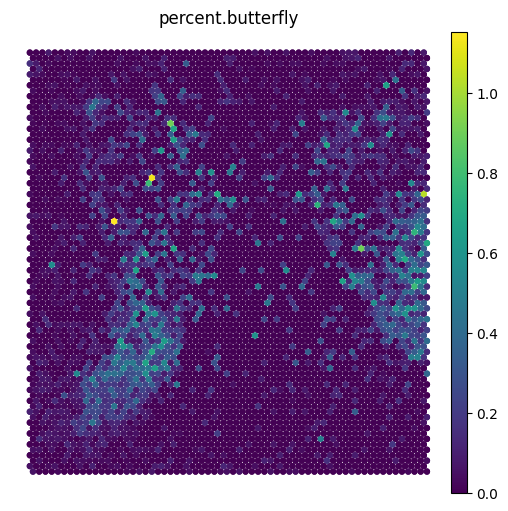

In [30]:

sq.pl.spatial_scatter(
    patient_1_eh,
    frameon=False,
    shape=None,
    size=50,
    color='percent.butterfly',
    figsize=(5, 5)
)

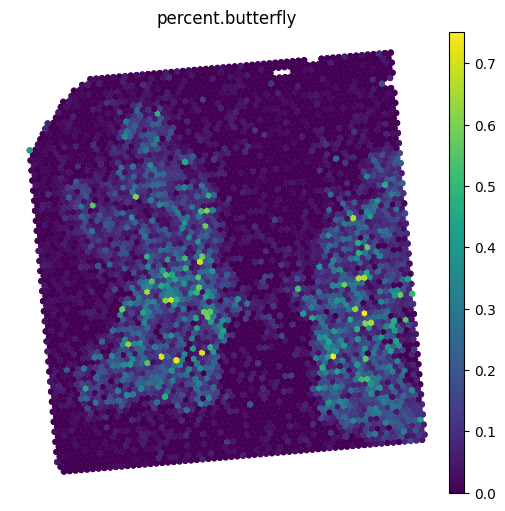

In [29]:
sq.pl.spatial_scatter(
    patient_prob_eh,
    frameon=False,
    shape=None,
    size=50,
    color='percent.butterfly',
    figsize=(5, 5)
)

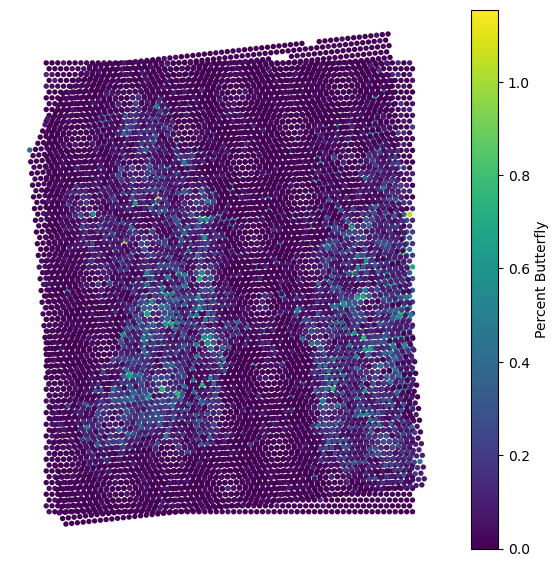

In [155]:
plot_slices_overlap([patient_1_e, patient_prob_e])

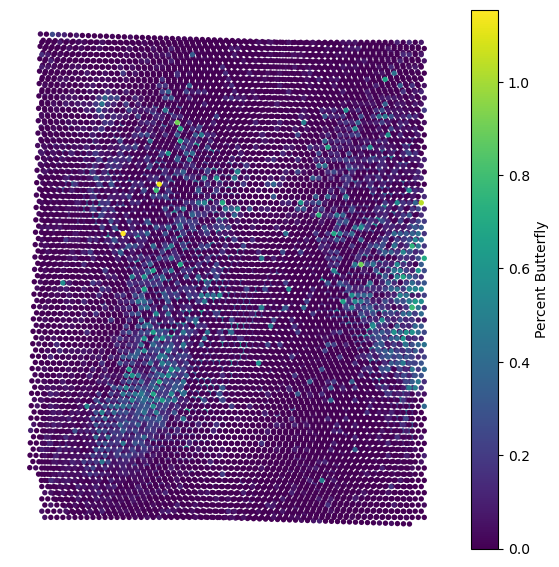

In [120]:
plot_slices_overlap([patient_prob_e, patient_1_e])

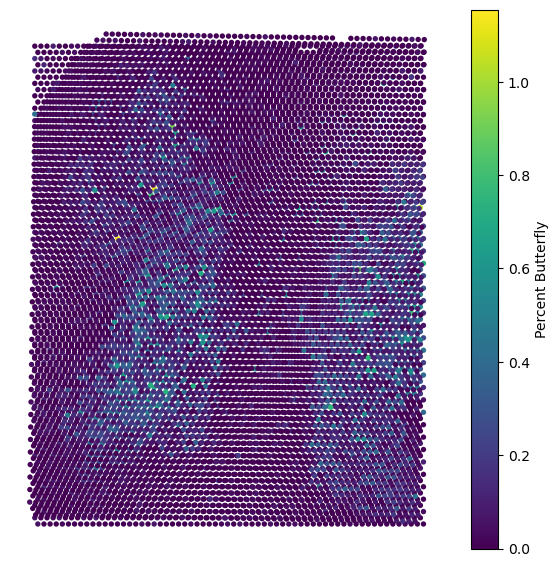

In [156]:
plot_slices_overlap([patient_1_h, patient_prob_h])

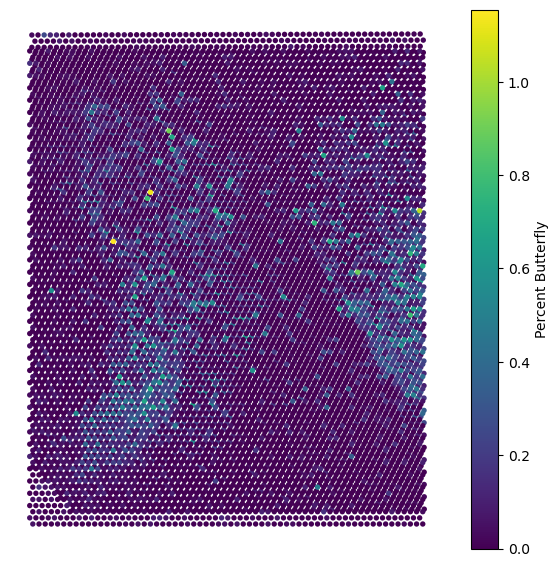

In [124]:
plot_slices_overlap([patient_prob_h, patient_1_h])

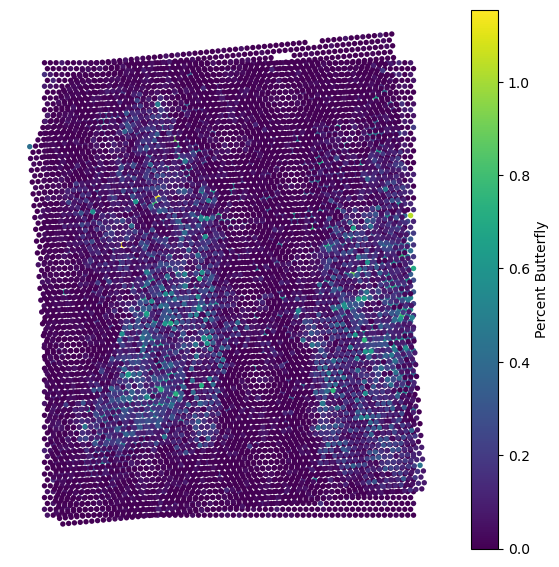

In [157]:
plot_slices_overlap([patient_1_eh, patient_prob_eh])

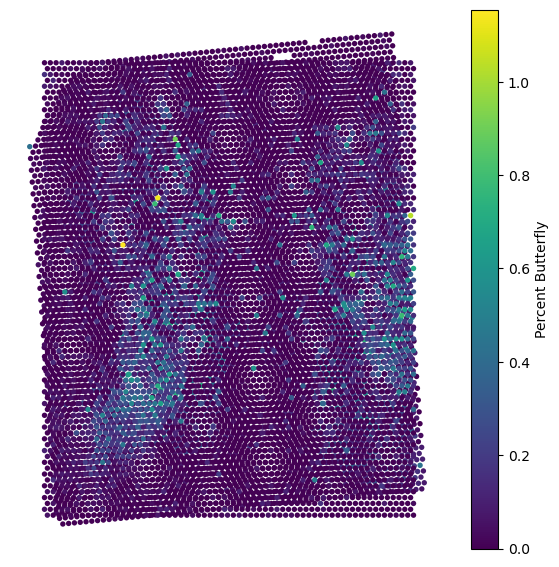

In [158]:
plot_slices_overlap([patient_prob_eh, patient_1_eh])

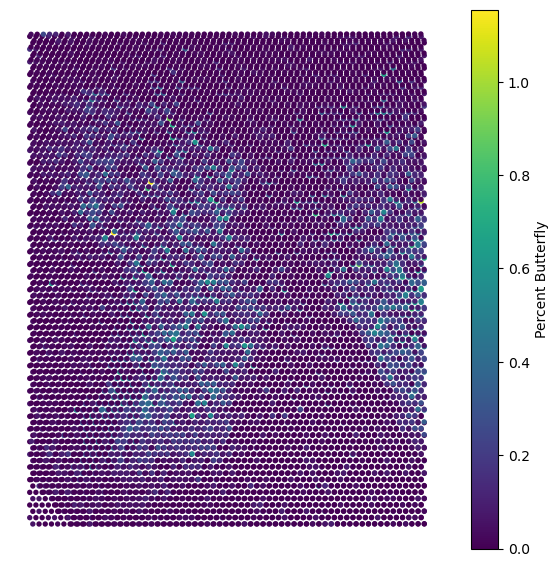

In [132]:
plot_slices_overlap([patient_1_orig, patient_prob_orig])

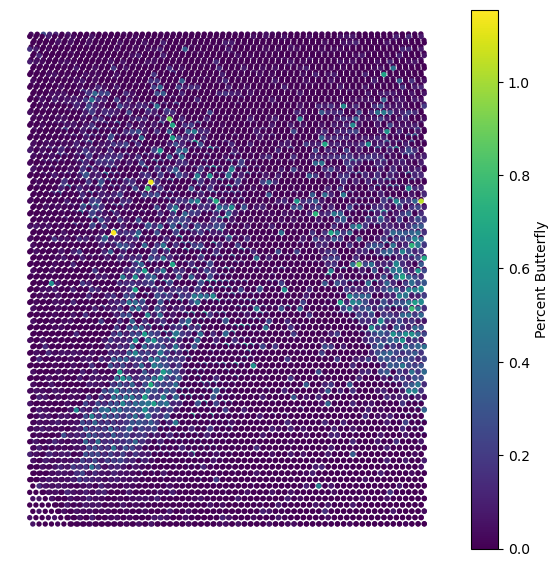

In [133]:
plot_slices_overlap([patient_prob_orig, patient_1_orig])

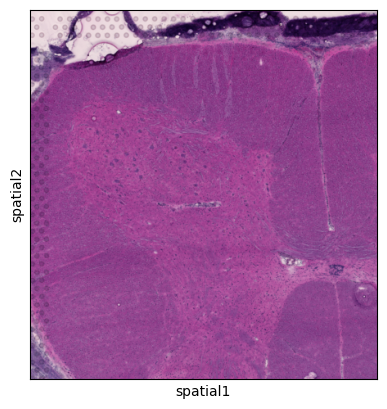

In [138]:
sc.pl.spatial(
    patient_prob_h,
    img_key='lowres'
)

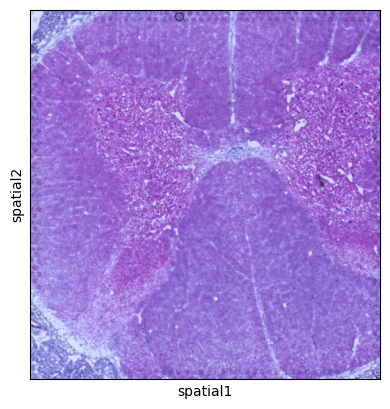

In [146]:
sc.pl.spatial(
    patient_1_h,
    img_key='lowres'
)


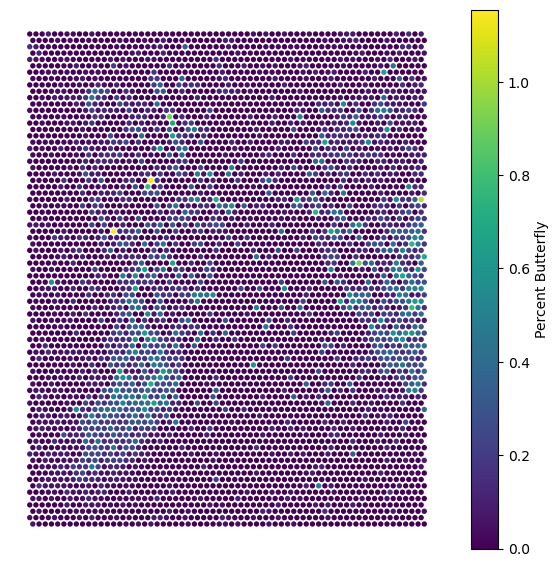

In [147]:
plot_slices_overlap([patient_1_h])

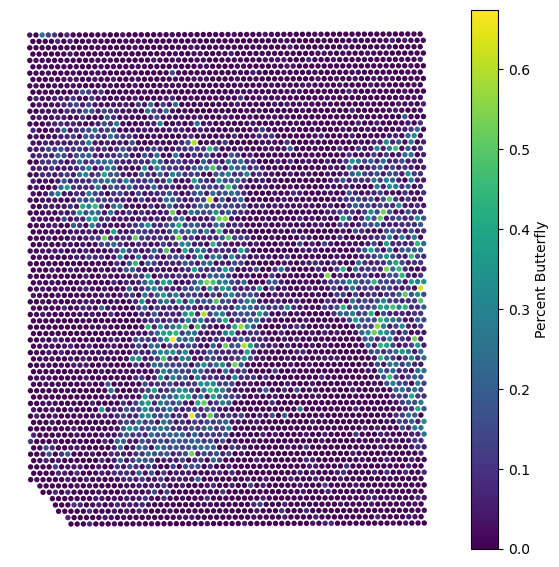

In [148]:
plot_slices_overlap([patient_prob_h])

In [85]:
"""
# Centrado segun la imagen de referencia de los spots alineados entre sí
rowmin_0 = min(patient_1_orig.obs.imagerow)
colmin_0 = min(patient_1_orig.obs.imagecol)

rowmin = np.min(patient_1_h.obsm['spatial'][:,0])
colmin = np.min(patient_1_h.obsm['spatial'][:,1])
"""

"\n# Centrado segun la imagen de referencia de los spots alineados entre sí\nrowmin_0 = min(patient_1_orig.obs.imagerow)\ncolmin_0 = min(patient_1_orig.obs.imagecol)\n\nrowmin = np.min(patient_1_h.obsm['spatial'][:,0])\ncolmin = np.min(patient_1_h.obsm['spatial'][:,1])\n"

In [352]:
"""
patient_1_h.obsm['spatial'][:,0] = patient_1_h.obsm['spatial'][:,0] - rowmin + rowmin_0
patient_1_h.obsm['spatial'][:,1] = patient_1_h.obsm['spatial'][:,1] - colmin + colmin_0
"""

In [353]:
"""
patient_prob_h.obsm['spatial'][:,0] = patient_prob_h.obsm['spatial'][:,0] - rowmin + rowmin_0
patient_prob_h.obsm['spatial'][:,1] = patient_prob_h.obsm['spatial'][:,1] - colmin + colmin_0
"""

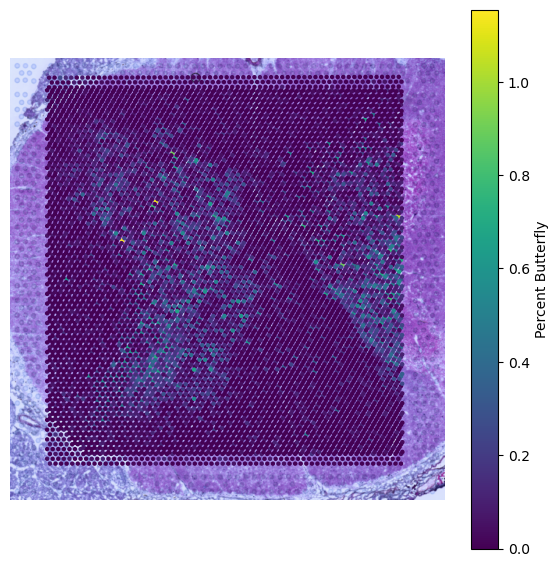

In [149]:
plot_slices_overlap_img([patient_1_h, patient_prob_h])

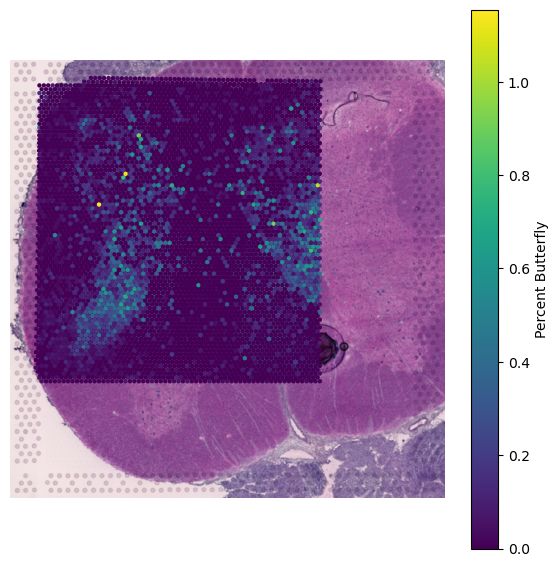

In [110]:
plot_slices_overlap_img([patient_prob_h, patient_1_h], patient_prob_h)

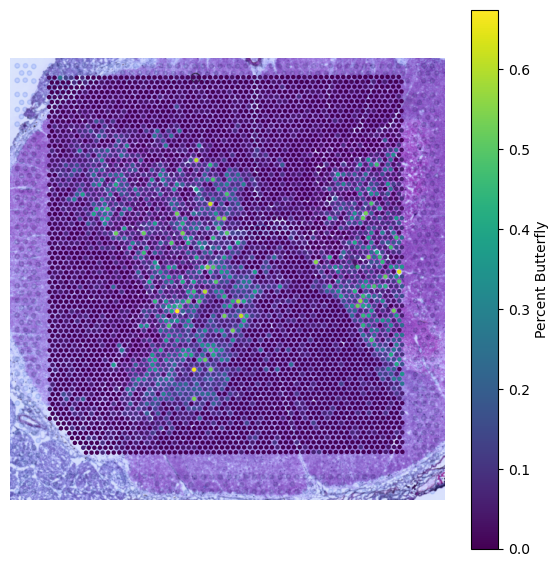

In [150]:
plot_slices_overlap_img([patient_prob_h], patient_1_h)

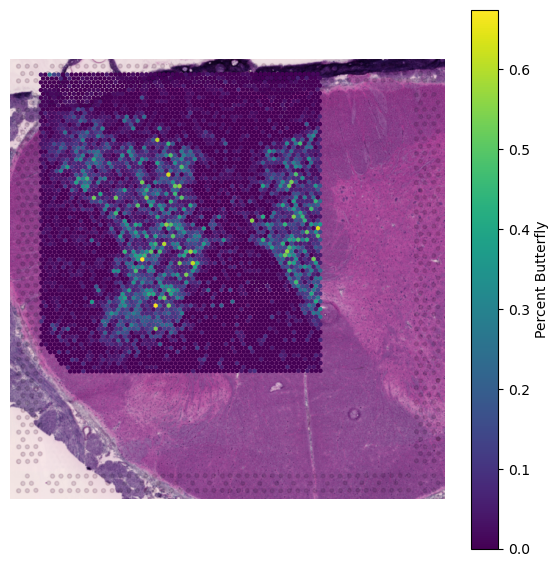

In [151]:
plot_slices_overlap_img([patient_prob_h], patient_prob_h)

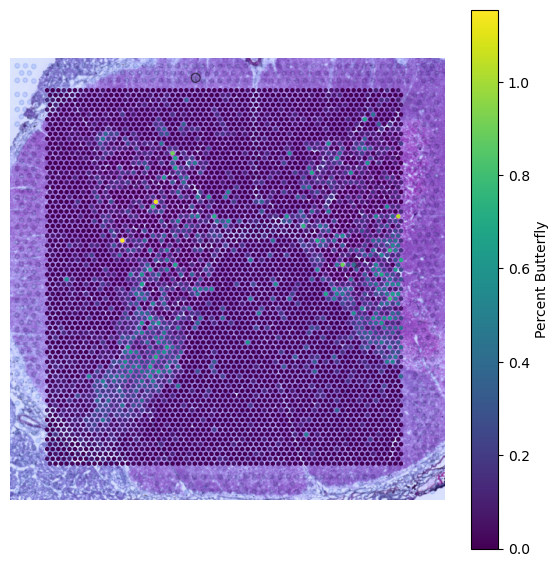

In [89]:
plot_slices_overlap_img([patient_1_h], patient_1_h)

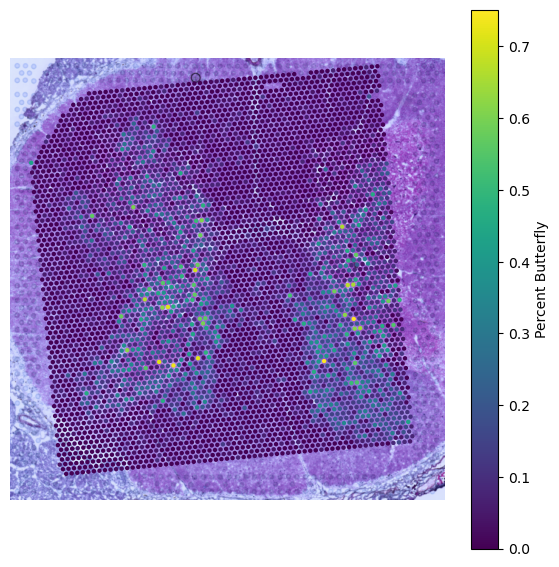

In [115]:
plot_slices_overlap_img([patient_prob_e], patient_1_e)